#Imports

In [ ]:
import os

import cv2

from tqdm.notebook import tqdm

from IPython.display import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image

import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np

#Device

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [ ]:
device = get_default_device()
device

device(type='cuda')

#Download Dataset

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/deewakarchakraborty/portrait-paintings'
od.download(dataset_url)

100%|██████████| 223M/223M [00:09<00:00, 24.6MB/s]


In [ ]:
DATA_DIR = './portrait-paintings'
print(os.listdir(DATA_DIR))

['Images']


In [ ]:
print(os.listdir(DATA_DIR + '/Images')[:10])

['robert-henri_167.jpg', 'marc-chagall_3.jpg', 'solomon-joseph-solomon_23.jpg', 'richard-gerstl_49.jpg', 'robert-henri_166.jpg', 'antonio-de-la-gandara_22.jpg', 'john-singer-sargent_97.jpg', 'pierre-bonnard_25.jpg', 'marie-bashkirtseff_14.jpg', 'niko-pirosmani_45.jpg']


#Prepare Data

In [ ]:
image_size = 128
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform = transforms.Compose([
                          transforms.Resize(image_size),
                          transforms.CenterCrop(image_size),
                          transforms.ToTensor(),
                          transforms.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle = True, num_workers = 4, pin_memory = True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


#Visualize Examples

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


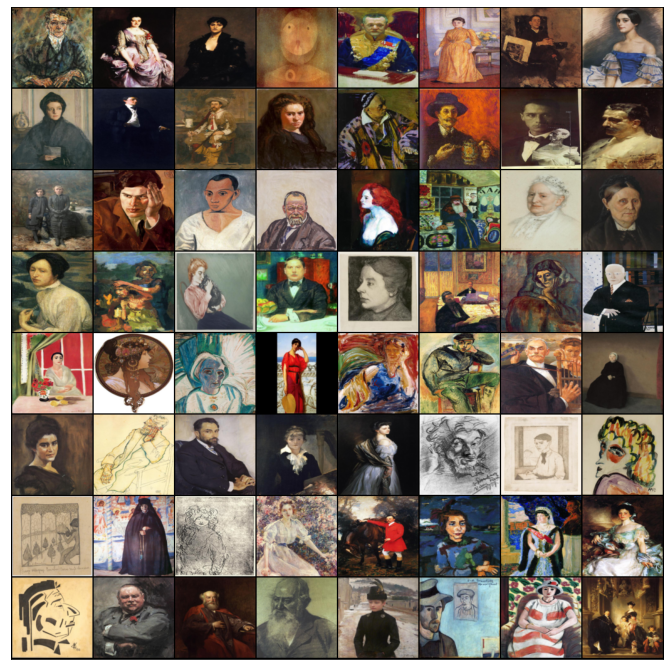

In [ ]:
show_batch(train_dl)

#Load Data

In [ ]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

#Discriminator Model

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 64 x 64

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 32 x 32

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 16 x 16

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 8 x 8

    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 4 x 4

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

#Generator Model

In [ ]:
latent_size = 256

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(True),
    # out: 1024 x 4 x 4

    nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 64 x 64

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128
)

torch.Size([128, 256, 1, 1])
torch.Size([128, 3, 128, 128])


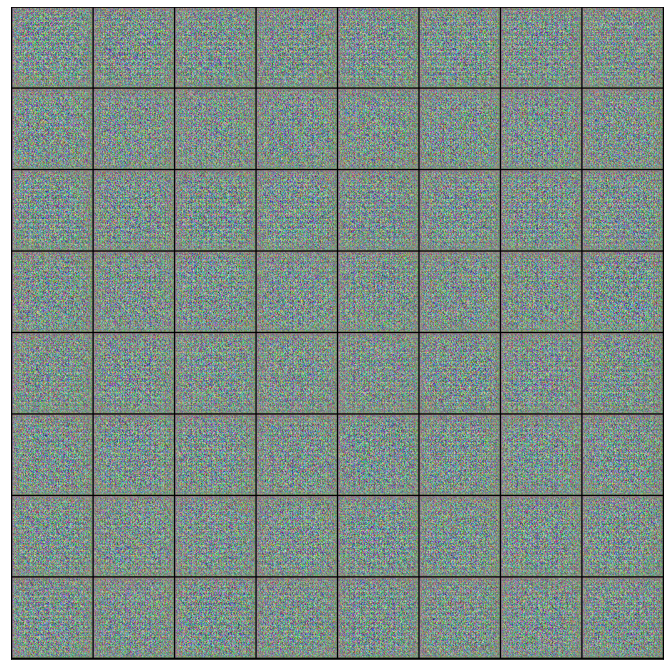

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
print(xb.shape)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

#Discriminator Training

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

#Generator Training

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

#Save Samples

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok = True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


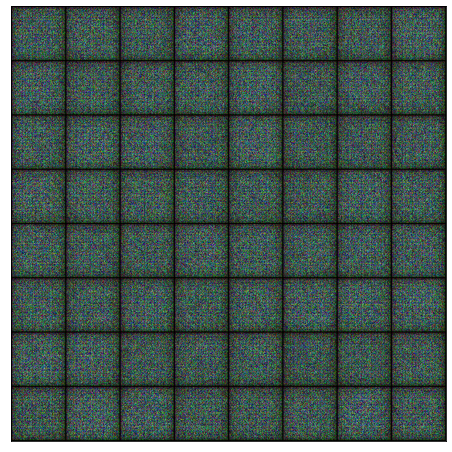

In [ ]:
save_samples(0, fixed_latent)

#Full Training Loop

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 200

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/45 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/200], loss_g: 6.7373, loss_d: 0.4906, real_score: 0.6768, fake_score: 0.0191
Saving generated-images-0001.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [2/200], loss_g: 4.3139, loss_d: 0.1121, real_score: 0.9865, fake_score: 0.0925
Saving generated-images-0002.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [3/200], loss_g: 4.1444, loss_d: 0.1507, real_score: 0.9335, fake_score: 0.0745
Saving generated-images-0003.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [4/200], loss_g: 14.4732, loss_d: 0.2771, real_score: 0.8214, fake_score: 0.0000
Saving generated-images-0004.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [5/200], loss_g: 7.0695, loss_d: 0.0109, real_score: 0.9955, fake_score: 0.0064
Saving generated-images-0005.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [6/200], loss_g: 6.5633, loss_d: 0.0106, real_score: 0.9965, fake_score: 0.0070
Saving generated-images-0006.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [7/200], loss_g: 7.1292, loss_d: 0.0189, real_score: 0.9838, fake_score: 0.0012
Saving generated-images-0007.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [8/200], loss_g: 7.0140, loss_d: 0.0048, real_score: 0.9976, fake_score: 0.0023
Saving generated-images-0008.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [9/200], loss_g: 7.3910, loss_d: 0.0031, real_score: 0.9992, fake_score: 0.0023
Saving generated-images-0009.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [10/200], loss_g: 7.1711, loss_d: 0.0044, real_score: 0.9976, fake_score: 0.0020
Saving generated-images-0010.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [11/200], loss_g: 7.4622, loss_d: 0.0032, real_score: 0.9983, fake_score: 0.0015
Saving generated-images-0011.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [12/200], loss_g: 7.8746, loss_d: 0.0013, real_score: 0.9993, fake_score: 0.0006
Saving generated-images-0012.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [13/200], loss_g: 8.2095, loss_d: 0.0011, real_score: 0.9992, fake_score: 0.0003
Saving generated-images-0013.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [14/200], loss_g: 7.6492, loss_d: 0.0009, real_score: 0.9996, fake_score: 0.0005
Saving generated-images-0014.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [15/200], loss_g: 6.9086, loss_d: 0.0046, real_score: 0.9971, fake_score: 0.0014
Saving generated-images-0015.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [16/200], loss_g: 7.6672, loss_d: 0.0015, real_score: 0.9993, fake_score: 0.0009
Saving generated-images-0016.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [17/200], loss_g: 7.4670, loss_d: 0.0015, real_score: 0.9995, fake_score: 0.0011
Saving generated-images-0017.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [18/200], loss_g: 7.5425, loss_d: 0.0013, real_score: 0.9994, fake_score: 0.0007
Saving generated-images-0018.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [19/200], loss_g: 7.5436, loss_d: 0.0010, real_score: 0.9997, fake_score: 0.0007
Saving generated-images-0019.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [20/200], loss_g: 7.6816, loss_d: 0.0008, real_score: 0.9998, fake_score: 0.0006
Saving generated-images-0020.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [21/200], loss_g: 7.5053, loss_d: 0.0010, real_score: 0.9999, fake_score: 0.0009
Saving generated-images-0021.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [22/200], loss_g: 9.0846, loss_d: 0.0003, real_score: 0.9998, fake_score: 0.0001
Saving generated-images-0022.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [23/200], loss_g: 9.8323, loss_d: 0.0002, real_score: 0.9999, fake_score: 0.0001
Saving generated-images-0023.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [24/200], loss_g: 8.5238, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0003
Saving generated-images-0024.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [25/200], loss_g: 8.2828, loss_d: 0.0006, real_score: 0.9999, fake_score: 0.0005
Saving generated-images-0025.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [26/200], loss_g: 8.9366, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0002
Saving generated-images-0026.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [27/200], loss_g: 9.5872, loss_d: 0.0002, real_score: 0.9999, fake_score: 0.0001
Saving generated-images-0027.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [28/200], loss_g: 9.9764, loss_d: 0.0004, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-0028.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [29/200], loss_g: 8.5131, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-0029.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [30/200], loss_g: 9.7051, loss_d: 0.0009, real_score: 0.9991, fake_score: 0.0000
Saving generated-images-0030.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [31/200], loss_g: 9.1666, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0002
Saving generated-images-0031.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [32/200], loss_g: 9.4315, loss_d: 0.0002, real_score: 0.9999, fake_score: 0.0001
Saving generated-images-0032.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [33/200], loss_g: 9.3210, loss_d: 0.0008, real_score: 0.9993, fake_score: 0.0001
Saving generated-images-0033.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [34/200], loss_g: 6.8676, loss_d: 0.0033, real_score: 0.9970, fake_score: 0.0002
Saving generated-images-0034.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [35/200], loss_g: 8.7722, loss_d: 0.0006, real_score: 0.9996, fake_score: 0.0002
Saving generated-images-0035.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [36/200], loss_g: 11.7467, loss_d: 0.0024, real_score: 0.9977, fake_score: 0.0000
Saving generated-images-0036.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [37/200], loss_g: 14.6963, loss_d: 1.1000, real_score: 0.7943, fake_score: 0.1546
Saving generated-images-0037.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [38/200], loss_g: 3.3484, loss_d: 0.7175, real_score: 0.6914, fake_score: 0.1999
Saving generated-images-0038.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [39/200], loss_g: 7.3812, loss_d: 0.1555, real_score: 0.9514, fake_score: 0.0976
Saving generated-images-0039.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [40/200], loss_g: 8.3945, loss_d: 0.0165, real_score: 0.9843, fake_score: 0.0004
Saving generated-images-0040.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [41/200], loss_g: 6.5916, loss_d: 0.0158, real_score: 0.9907, fake_score: 0.0063
Saving generated-images-0041.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [42/200], loss_g: 6.5295, loss_d: 0.0087, real_score: 0.9938, fake_score: 0.0024
Saving generated-images-0042.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [43/200], loss_g: 6.4326, loss_d: 0.0067, real_score: 0.9979, fake_score: 0.0046
Saving generated-images-0043.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [44/200], loss_g: 11.8277, loss_d: 0.0054, real_score: 0.9947, fake_score: 0.0000
Saving generated-images-0044.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [45/200], loss_g: 6.8853, loss_d: 0.0133, real_score: 0.9985, fake_score: 0.0118
Saving generated-images-0045.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [46/200], loss_g: 7.5672, loss_d: 0.0020, real_score: 0.9988, fake_score: 0.0009
Saving generated-images-0046.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [47/200], loss_g: 7.9694, loss_d: 0.0027, real_score: 0.9977, fake_score: 0.0003
Saving generated-images-0047.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [48/200], loss_g: 7.2057, loss_d: 0.0019, real_score: 0.9990, fake_score: 0.0009
Saving generated-images-0048.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [49/200], loss_g: 4.8865, loss_d: 0.1351, real_score: 0.9482, fake_score: 0.0757
Saving generated-images-0049.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [50/200], loss_g: 10.7487, loss_d: 0.1850, real_score: 0.9088, fake_score: 0.0001
Saving generated-images-0050.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [51/200], loss_g: 7.0614, loss_d: 0.0059, real_score: 0.9970, fake_score: 0.0028
Saving generated-images-0051.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [52/200], loss_g: 6.9008, loss_d: 0.0030, real_score: 0.9985, fake_score: 0.0015
Saving generated-images-0052.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [53/200], loss_g: 7.0827, loss_d: 0.0015, real_score: 0.9997, fake_score: 0.0012
Saving generated-images-0053.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [54/200], loss_g: 7.7027, loss_d: 0.0014, real_score: 0.9994, fake_score: 0.0008
Saving generated-images-0054.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [55/200], loss_g: 2.9972, loss_d: 0.8313, real_score: 0.6909, fake_score: 0.0948
Saving generated-images-0055.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [56/200], loss_g: 3.9738, loss_d: 0.3092, real_score: 0.8515, fake_score: 0.1000
Saving generated-images-0056.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [57/200], loss_g: 4.6605, loss_d: 0.5272, real_score: 0.7206, fake_score: 0.0069
Saving generated-images-0057.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [58/200], loss_g: 3.6247, loss_d: 0.3337, real_score: 0.8323, fake_score: 0.0912
Saving generated-images-0058.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [59/200], loss_g: 3.5979, loss_d: 0.3347, real_score: 0.8282, fake_score: 0.1061
Saving generated-images-0059.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [60/200], loss_g: 0.8155, loss_d: 0.6368, real_score: 0.6461, fake_score: 0.0375
Saving generated-images-0060.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [61/200], loss_g: 4.5919, loss_d: 0.4508, real_score: 0.8335, fake_score: 0.1866
Saving generated-images-0061.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [62/200], loss_g: 3.6275, loss_d: 0.4337, real_score: 0.8517, fake_score: 0.2061
Saving generated-images-0062.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [63/200], loss_g: 3.4935, loss_d: 0.4156, real_score: 0.7606, fake_score: 0.0504
Saving generated-images-0063.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [64/200], loss_g: 3.6618, loss_d: 0.4215, real_score: 0.8745, fake_score: 0.2107
Saving generated-images-0064.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [65/200], loss_g: 3.8567, loss_d: 0.2547, real_score: 0.8997, fake_score: 0.1201
Saving generated-images-0065.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [66/200], loss_g: 3.5796, loss_d: 0.3698, real_score: 0.7520, fake_score: 0.0462
Saving generated-images-0066.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [67/200], loss_g: 1.1910, loss_d: 0.4850, real_score: 0.8011, fake_score: 0.1808
Saving generated-images-0067.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [68/200], loss_g: 2.5965, loss_d: 3.0030, real_score: 0.1251, fake_score: 0.0054
Saving generated-images-0068.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [69/200], loss_g: 2.7402, loss_d: 1.3796, real_score: 0.3296, fake_score: 0.0217
Saving generated-images-0069.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [70/200], loss_g: 10.0775, loss_d: 1.0406, real_score: 0.9509, fake_score: 0.5445
Saving generated-images-0070.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [71/200], loss_g: 5.5619, loss_d: 0.4138, real_score: 0.8817, fake_score: 0.2259
Saving generated-images-0071.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [72/200], loss_g: 5.0052, loss_d: 0.5825, real_score: 0.9629, fake_score: 0.3677
Saving generated-images-0072.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [73/200], loss_g: 3.3667, loss_d: 0.2167, real_score: 0.8557, fake_score: 0.0323
Saving generated-images-0073.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [74/200], loss_g: 3.1101, loss_d: 0.5757, real_score: 0.6485, fake_score: 0.0289
Saving generated-images-0074.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [75/200], loss_g: 3.2057, loss_d: 0.4254, real_score: 0.8265, fake_score: 0.1707
Saving generated-images-0075.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [76/200], loss_g: 5.4346, loss_d: 0.4485, real_score: 0.9375, fake_score: 0.2787
Saving generated-images-0076.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [77/200], loss_g: 5.5742, loss_d: 0.6391, real_score: 0.9507, fake_score: 0.4000
Saving generated-images-0077.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [78/200], loss_g: 3.1642, loss_d: 0.9240, real_score: 0.4980, fake_score: 0.0192
Saving generated-images-0078.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [79/200], loss_g: 4.9185, loss_d: 0.3356, real_score: 0.8560, fake_score: 0.1350
Saving generated-images-0079.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [80/200], loss_g: 5.5907, loss_d: 0.3687, real_score: 0.7430, fake_score: 0.0158
Saving generated-images-0080.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [81/200], loss_g: 6.2590, loss_d: 0.5249, real_score: 0.8737, fake_score: 0.2891
Saving generated-images-0081.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [82/200], loss_g: 3.6935, loss_d: 0.5770, real_score: 0.7437, fake_score: 0.1940
Saving generated-images-0082.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [83/200], loss_g: 3.0351, loss_d: 0.7750, real_score: 0.6410, fake_score: 0.1519
Saving generated-images-0083.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [84/200], loss_g: 0.7177, loss_d: 0.9263, real_score: 0.5131, fake_score: 0.0949
Saving generated-images-0084.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [85/200], loss_g: 5.5309, loss_d: 0.8540, real_score: 0.8096, fake_score: 0.4059
Saving generated-images-0085.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [86/200], loss_g: 5.2167, loss_d: 0.4910, real_score: 0.6871, fake_score: 0.0184
Saving generated-images-0086.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [87/200], loss_g: 5.0633, loss_d: 0.6717, real_score: 0.9742, fake_score: 0.4260
Saving generated-images-0087.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [88/200], loss_g: 3.6106, loss_d: 0.3320, real_score: 0.8787, fake_score: 0.1520
Saving generated-images-0088.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [89/200], loss_g: 3.7730, loss_d: 0.3389, real_score: 0.8987, fake_score: 0.1788
Saving generated-images-0089.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [90/200], loss_g: 3.8566, loss_d: 0.4530, real_score: 0.6838, fake_score: 0.0187
Saving generated-images-0090.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [91/200], loss_g: 3.4758, loss_d: 0.1840, real_score: 0.9563, fake_score: 0.1170
Saving generated-images-0091.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [92/200], loss_g: 6.9457, loss_d: 1.2081, real_score: 0.3873, fake_score: 0.0002
Saving generated-images-0092.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [93/200], loss_g: 4.4965, loss_d: 0.3367, real_score: 0.8395, fake_score: 0.1098
Saving generated-images-0093.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [94/200], loss_g: 3.2247, loss_d: 0.5204, real_score: 0.7053, fake_score: 0.0790
Saving generated-images-0094.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [95/200], loss_g: 4.5405, loss_d: 0.2337, real_score: 0.8651, fake_score: 0.0643
Saving generated-images-0095.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [96/200], loss_g: 6.8416, loss_d: 0.5710, real_score: 0.9451, fake_score: 0.3623
Saving generated-images-0096.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [97/200], loss_g: 5.1823, loss_d: 0.3269, real_score: 0.8800, fake_score: 0.1425
Saving generated-images-0097.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [98/200], loss_g: 6.0468, loss_d: 0.4430, real_score: 0.8840, fake_score: 0.2379
Saving generated-images-0098.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [99/200], loss_g: 3.0817, loss_d: 0.5865, real_score: 0.6491, fake_score: 0.0415
Saving generated-images-0099.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [100/200], loss_g: 4.8403, loss_d: 0.2880, real_score: 0.9225, fake_score: 0.1686
Saving generated-images-0100.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [101/200], loss_g: 5.6561, loss_d: 0.5277, real_score: 0.8237, fake_score: 0.2196
Saving generated-images-0101.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [102/200], loss_g: 7.3847, loss_d: 0.1118, real_score: 0.9190, fake_score: 0.0195
Saving generated-images-0102.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [103/200], loss_g: 4.5513, loss_d: 0.2676, real_score: 0.8521, fake_score: 0.0766
Saving generated-images-0103.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [104/200], loss_g: 8.4177, loss_d: 0.5632, real_score: 0.9840, fake_score: 0.3480
Saving generated-images-0104.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [105/200], loss_g: 3.0266, loss_d: 1.2379, real_score: 0.4161, fake_score: 0.0130
Saving generated-images-0105.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [106/200], loss_g: 2.0749, loss_d: 0.1245, real_score: 0.9743, fake_score: 0.0746
Saving generated-images-0106.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [107/200], loss_g: 4.8855, loss_d: 0.4587, real_score: 0.7375, fake_score: 0.0849
Saving generated-images-0107.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [108/200], loss_g: 10.2242, loss_d: 0.8335, real_score: 0.9076, fake_score: 0.4454
Saving generated-images-0108.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [109/200], loss_g: 3.1302, loss_d: 0.5665, real_score: 0.6467, fake_score: 0.0265
Saving generated-images-0109.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [110/200], loss_g: 3.3547, loss_d: 0.4918, real_score: 0.9143, fake_score: 0.2257
Saving generated-images-0110.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [111/200], loss_g: 2.5018, loss_d: 1.0830, real_score: 0.5192, fake_score: 0.0558
Saving generated-images-0111.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [112/200], loss_g: 3.8834, loss_d: 0.3008, real_score: 0.8701, fake_score: 0.1256
Saving generated-images-0112.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [113/200], loss_g: 5.0798, loss_d: 0.2768, real_score: 0.9560, fake_score: 0.1780
Saving generated-images-0113.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [114/200], loss_g: 3.7444, loss_d: 0.5953, real_score: 0.7379, fake_score: 0.1651
Saving generated-images-0114.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [115/200], loss_g: 1.4470, loss_d: 1.9691, real_score: 0.2241, fake_score: 0.0006
Saving generated-images-0115.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [116/200], loss_g: 5.4638, loss_d: 0.4908, real_score: 0.8503, fake_score: 0.2320
Saving generated-images-0116.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [117/200], loss_g: 7.9534, loss_d: 0.7069, real_score: 0.9051, fake_score: 0.3961
Saving generated-images-0117.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [118/200], loss_g: 7.3487, loss_d: 0.3969, real_score: 0.9215, fake_score: 0.2379
Saving generated-images-0118.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [119/200], loss_g: 5.0583, loss_d: 0.3349, real_score: 0.8859, fake_score: 0.1547
Saving generated-images-0119.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [120/200], loss_g: 5.0621, loss_d: 0.2153, real_score: 0.9074, fake_score: 0.0971
Saving generated-images-0120.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [121/200], loss_g: 6.1102, loss_d: 0.1827, real_score: 0.8901, fake_score: 0.0448
Saving generated-images-0121.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [122/200], loss_g: 3.4960, loss_d: 0.4308, real_score: 0.7428, fake_score: 0.0623
Saving generated-images-0122.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [123/200], loss_g: 3.7000, loss_d: 0.2765, real_score: 0.9111, fake_score: 0.1438
Saving generated-images-0123.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [124/200], loss_g: 2.6974, loss_d: 0.3159, real_score: 0.8405, fake_score: 0.1084
Saving generated-images-0124.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [125/200], loss_g: 4.1487, loss_d: 0.4248, real_score: 0.7820, fake_score: 0.1259
Saving generated-images-0125.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [126/200], loss_g: 2.6274, loss_d: 0.5219, real_score: 0.7021, fake_score: 0.0260
Saving generated-images-0126.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [127/200], loss_g: 4.6169, loss_d: 0.2235, real_score: 0.8839, fake_score: 0.0750
Saving generated-images-0127.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [128/200], loss_g: 4.3010, loss_d: 0.1900, real_score: 0.9107, fake_score: 0.0737
Saving generated-images-0128.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [129/200], loss_g: 4.0472, loss_d: 0.2668, real_score: 0.8746, fake_score: 0.1033
Saving generated-images-0129.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [130/200], loss_g: 2.9981, loss_d: 0.6222, real_score: 0.6484, fake_score: 0.0616
Saving generated-images-0130.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [131/200], loss_g: 3.7000, loss_d: 0.3391, real_score: 0.7785, fake_score: 0.0365
Saving generated-images-0131.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [132/200], loss_g: 4.1202, loss_d: 0.2878, real_score: 0.9679, fake_score: 0.2013
Saving generated-images-0132.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [133/200], loss_g: 9.7662, loss_d: 0.8842, real_score: 0.8472, fake_score: 0.4191
Saving generated-images-0133.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [134/200], loss_g: 6.1911, loss_d: 0.4822, real_score: 0.8804, fake_score: 0.2561
Saving generated-images-0134.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [135/200], loss_g: 3.9330, loss_d: 0.1801, real_score: 0.8670, fake_score: 0.0105
Saving generated-images-0135.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [136/200], loss_g: 3.9477, loss_d: 0.2733, real_score: 0.8378, fake_score: 0.0565
Saving generated-images-0136.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [137/200], loss_g: 4.1375, loss_d: 0.1236, real_score: 0.9444, fake_score: 0.0579
Saving generated-images-0137.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [138/200], loss_g: 2.9680, loss_d: 0.6691, real_score: 0.6474, fake_score: 0.0841
Saving generated-images-0138.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [139/200], loss_g: 7.9335, loss_d: 0.2304, real_score: 0.8278, fake_score: 0.0038
Saving generated-images-0139.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [140/200], loss_g: 6.4904, loss_d: 0.3548, real_score: 0.9147, fake_score: 0.2065
Saving generated-images-0140.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [141/200], loss_g: 5.2988, loss_d: 0.3030, real_score: 0.9808, fake_score: 0.2188
Saving generated-images-0141.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [142/200], loss_g: 5.3256, loss_d: 0.2159, real_score: 0.9572, fake_score: 0.1375
Saving generated-images-0142.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [143/200], loss_g: 3.8625, loss_d: 0.2012, real_score: 0.9606, fake_score: 0.1120
Saving generated-images-0143.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [144/200], loss_g: 5.1569, loss_d: 0.2927, real_score: 0.9858, fake_score: 0.2040
Saving generated-images-0144.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [145/200], loss_g: 2.9759, loss_d: 0.7339, real_score: 0.5545, fake_score: 0.0083
Saving generated-images-0145.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [146/200], loss_g: 5.2922, loss_d: 0.2158, real_score: 0.9445, fake_score: 0.1297
Saving generated-images-0146.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [147/200], loss_g: 6.3604, loss_d: 0.6048, real_score: 0.9713, fake_score: 0.3620
Saving generated-images-0147.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [148/200], loss_g: 4.8976, loss_d: 0.2714, real_score: 0.9715, fake_score: 0.1878
Saving generated-images-0148.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [149/200], loss_g: 8.0325, loss_d: 0.3188, real_score: 0.9928, fake_score: 0.2234
Saving generated-images-0149.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [150/200], loss_g: 5.1148, loss_d: 0.1501, real_score: 0.8921, fake_score: 0.0159
Saving generated-images-0150.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [151/200], loss_g: 4.7665, loss_d: 0.1834, real_score: 0.9244, fake_score: 0.0866
Saving generated-images-0151.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [152/200], loss_g: 5.1588, loss_d: 0.1554, real_score: 0.9070, fake_score: 0.0422
Saving generated-images-0152.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [153/200], loss_g: 3.5235, loss_d: 0.3011, real_score: 0.8391, fake_score: 0.0770
Saving generated-images-0153.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [154/200], loss_g: 2.5530, loss_d: 0.4153, real_score: 0.7680, fake_score: 0.0866
Saving generated-images-0154.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [155/200], loss_g: 4.0541, loss_d: 0.2903, real_score: 0.8804, fake_score: 0.1270
Saving generated-images-0155.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [156/200], loss_g: 4.2275, loss_d: 0.3205, real_score: 0.7780, fake_score: 0.0112
Saving generated-images-0156.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [157/200], loss_g: 7.9377, loss_d: 0.4594, real_score: 0.9910, fake_score: 0.2751
Saving generated-images-0157.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [158/200], loss_g: 3.2666, loss_d: 0.4450, real_score: 0.7783, fake_score: 0.1099
Saving generated-images-0158.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [159/200], loss_g: 3.4436, loss_d: 0.2056, real_score: 0.9583, fake_score: 0.1307
Saving generated-images-0159.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [160/200], loss_g: 6.9817, loss_d: 0.5046, real_score: 0.9569, fake_score: 0.3107
Saving generated-images-0160.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [161/200], loss_g: 4.5349, loss_d: 0.1039, real_score: 0.9518, fake_score: 0.0469
Saving generated-images-0161.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [162/200], loss_g: 6.0463, loss_d: 0.3280, real_score: 0.9846, fake_score: 0.2278
Saving generated-images-0162.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [163/200], loss_g: 4.4075, loss_d: 0.3806, real_score: 0.7796, fake_score: 0.0662
Saving generated-images-0163.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [164/200], loss_g: 4.1899, loss_d: 0.1823, real_score: 0.9018, fake_score: 0.0632
Saving generated-images-0164.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [165/200], loss_g: 6.1980, loss_d: 0.6013, real_score: 0.9791, fake_score: 0.3434
Saving generated-images-0165.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [166/200], loss_g: 11.8802, loss_d: 2.6592, real_score: 0.9905, fake_score: 0.8710
Saving generated-images-0166.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [167/200], loss_g: 6.1832, loss_d: 0.5527, real_score: 0.9975, fake_score: 0.3650
Saving generated-images-0167.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [168/200], loss_g: 4.6552, loss_d: 0.1846, real_score: 0.9675, fake_score: 0.1263
Saving generated-images-0168.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [169/200], loss_g: 5.4258, loss_d: 0.4019, real_score: 0.9481, fake_score: 0.2449
Saving generated-images-0169.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [170/200], loss_g: 5.8795, loss_d: 0.2022, real_score: 0.8893, fake_score: 0.0679
Saving generated-images-0170.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [171/200], loss_g: 3.4264, loss_d: 0.3097, real_score: 0.8749, fake_score: 0.1128
Saving generated-images-0171.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [172/200], loss_g: 4.8462, loss_d: 0.1988, real_score: 0.8649, fake_score: 0.0354
Saving generated-images-0172.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [173/200], loss_g: 8.2195, loss_d: 1.0297, real_score: 0.9715, fake_score: 0.5328
Saving generated-images-0173.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [174/200], loss_g: 3.2139, loss_d: 0.2971, real_score: 0.7939, fake_score: 0.0350
Saving generated-images-0174.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [175/200], loss_g: 6.2215, loss_d: 0.2322, real_score: 0.8877, fake_score: 0.0846
Saving generated-images-0175.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [176/200], loss_g: 4.6482, loss_d: 0.1795, real_score: 0.9551, fake_score: 0.1044
Saving generated-images-0176.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [177/200], loss_g: 3.6376, loss_d: 0.4443, real_score: 0.7630, fake_score: 0.0816
Saving generated-images-0177.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [178/200], loss_g: 2.5732, loss_d: 0.4850, real_score: 0.6848, fake_score: 0.0262
Saving generated-images-0178.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [179/200], loss_g: 2.8869, loss_d: 0.3886, real_score: 0.7643, fake_score: 0.0664
Saving generated-images-0179.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [180/200], loss_g: 4.2021, loss_d: 0.2207, real_score: 0.9014, fake_score: 0.0889
Saving generated-images-0180.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [181/200], loss_g: 6.7734, loss_d: 0.3910, real_score: 0.9885, fake_score: 0.2521
Saving generated-images-0181.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [182/200], loss_g: 0.7906, loss_d: 1.1028, real_score: 0.4470, fake_score: 0.0097
Saving generated-images-0182.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [183/200], loss_g: 4.7082, loss_d: 0.5509, real_score: 0.8478, fake_score: 0.2668
Saving generated-images-0183.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [184/200], loss_g: 3.0668, loss_d: 0.2145, real_score: 0.8753, fake_score: 0.0491
Saving generated-images-0184.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [185/200], loss_g: 2.3242, loss_d: 0.4113, real_score: 0.7657, fake_score: 0.0884
Saving generated-images-0185.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [186/200], loss_g: 3.3558, loss_d: 0.5716, real_score: 0.6488, fake_score: 0.0102
Saving generated-images-0186.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [187/200], loss_g: 3.0488, loss_d: 0.6136, real_score: 0.6242, fake_score: 0.0184
Saving generated-images-0187.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [188/200], loss_g: 6.5766, loss_d: 0.3068, real_score: 0.9376, fake_score: 0.1825
Saving generated-images-0188.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [189/200], loss_g: 2.6222, loss_d: 0.6507, real_score: 0.6065, fake_score: 0.0211
Saving generated-images-0189.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [190/200], loss_g: 5.3515, loss_d: 0.2961, real_score: 0.9555, fake_score: 0.1788
Saving generated-images-0190.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [191/200], loss_g: 4.4949, loss_d: 0.1647, real_score: 0.9113, fake_score: 0.0577
Saving generated-images-0191.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [192/200], loss_g: 1.8136, loss_d: 0.3616, real_score: 0.7586, fake_score: 0.0316
Saving generated-images-0192.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [193/200], loss_g: 3.0463, loss_d: 0.2957, real_score: 0.8593, fake_score: 0.1057
Saving generated-images-0193.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [194/200], loss_g: 3.7754, loss_d: 0.2433, real_score: 0.9064, fake_score: 0.1096
Saving generated-images-0194.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [195/200], loss_g: 4.3536, loss_d: 0.5352, real_score: 0.9780, fake_score: 0.3258
Saving generated-images-0195.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [196/200], loss_g: 3.9349, loss_d: 0.2165, real_score: 0.8782, fake_score: 0.0648
Saving generated-images-0196.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [197/200], loss_g: 4.3727, loss_d: 0.2166, real_score: 0.8431, fake_score: 0.0301
Saving generated-images-0197.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [198/200], loss_g: 8.2512, loss_d: 1.4264, real_score: 0.9793, fake_score: 0.5902
Saving generated-images-0198.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [199/200], loss_g: 3.8726, loss_d: 0.2574, real_score: 0.8165, fake_score: 0.0178
Saving generated-images-0199.png


  0%|          | 0/45 [00:00<?, ?it/s]

Epoch [200/200], loss_g: 4.8084, loss_d: 0.2210, real_score: 0.8585, fake_score: 0.0412
Saving generated-images-0200.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

#Saving the model

In [ ]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

#Results

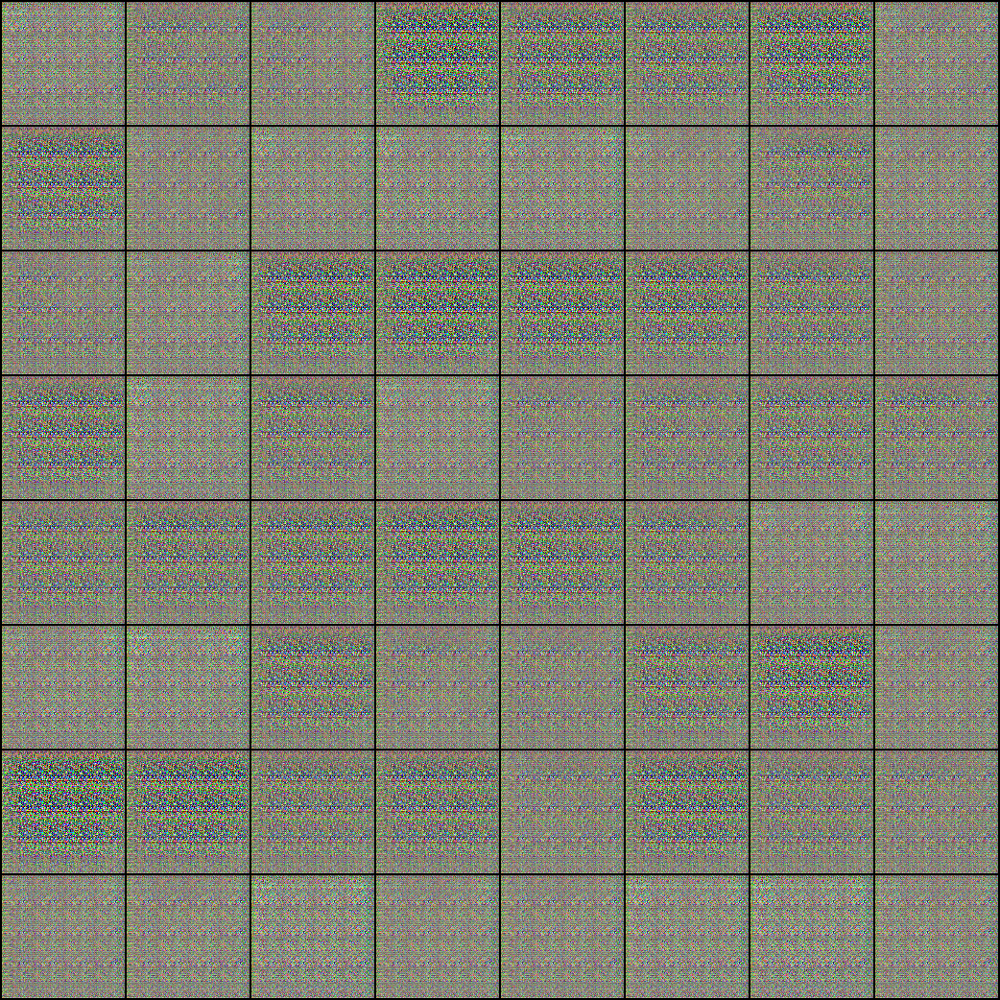

In [ ]:
Image('./generated/generated-images-0050.png')

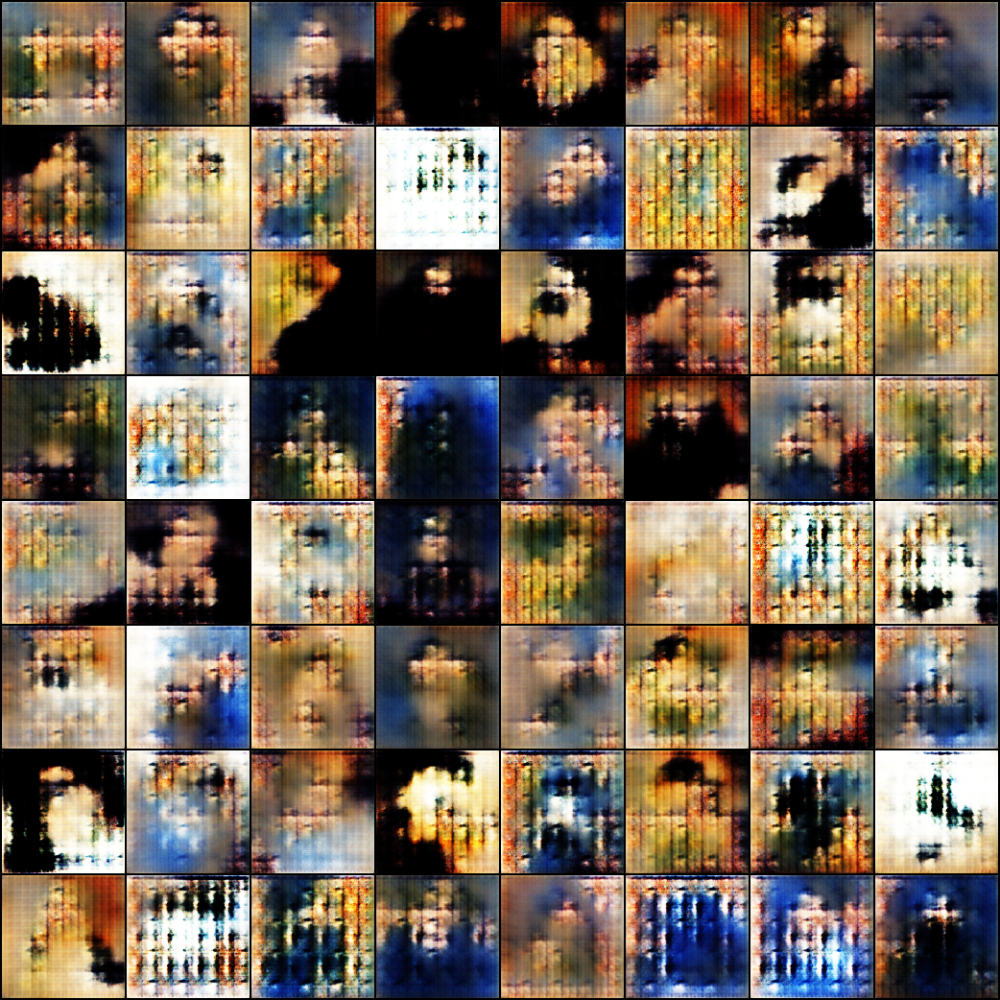

In [ ]:
Image('./generated/generated-images-0100.png')

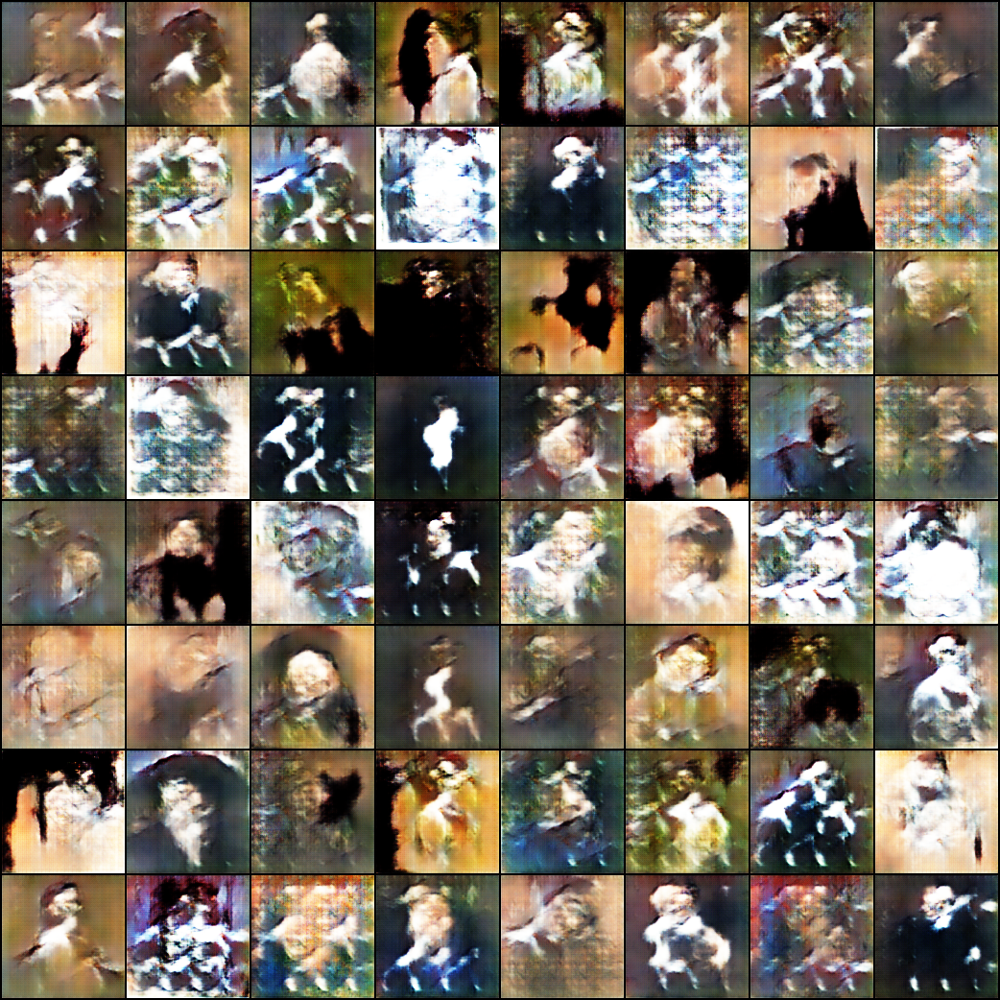

In [ ]:
Image('./generated/generated-images-0150.png')

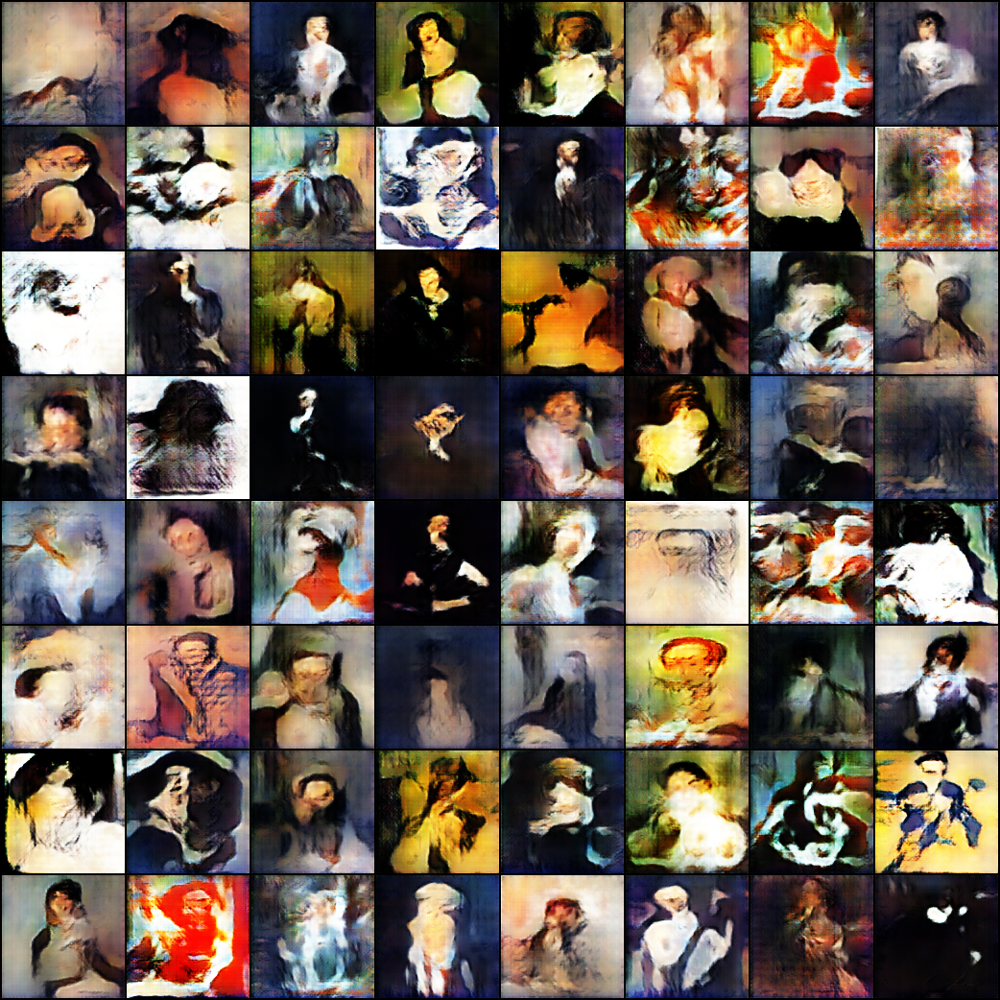

In [ ]:
Image('./generated/generated-images-0200.png')

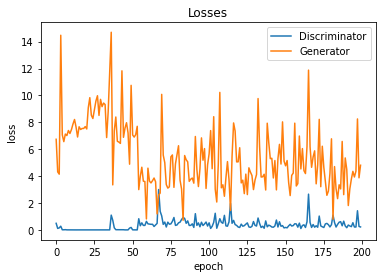

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

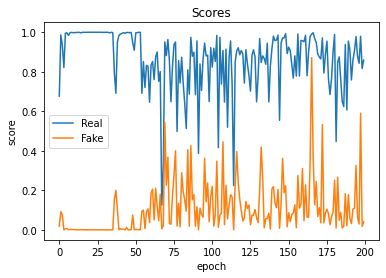

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'XVID'), 1, (1042,1042))
[out.write(cv2.imread(fname)) for fname in files]
out.release()